# Identifying Entities in Healthcare Data

##Workspace set up: Import and Install useful packages.

In [1]:
!pip install pycrf
!pip install sklearn-crfsuite

import spacy
import sklearn_crfsuite
from sklearn_crfsuite import metrics

model = spacy.load("en_core_web_sm")

  Preparing metadata (setup.py) ... done
  Created wheel for pycrf: filename=pycrf-0.0.1-py3-none-any.whl size=1870 sha256=08e520dea0d48b149a07d3752ffa0ecf1cd7d1176cc929e6f7385943232bc49c
  Stored in directory: /root/.cache/pip/wheels/e3/d2/c9/ba15b05ba596e2eafeb83c2903e79d634207367555aae8c7d2
Successfully built pycrf
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 15.1 MB/s eta 0:00:00


##Data Preprocessing

The dataset provided is in the form of one word per line. Let's understand the format of data below:
- Suppose there are *x* words in a sentence, then there will be *x* continuous lines with one word in each line.
- Further, the two sentences are separated by empty lines. The labels for the data follow the same format.

**We need to pre-process the data to recover the complete sentences and their labels.**


### Construct the proper sentences from individual words and print the 5 sentences.

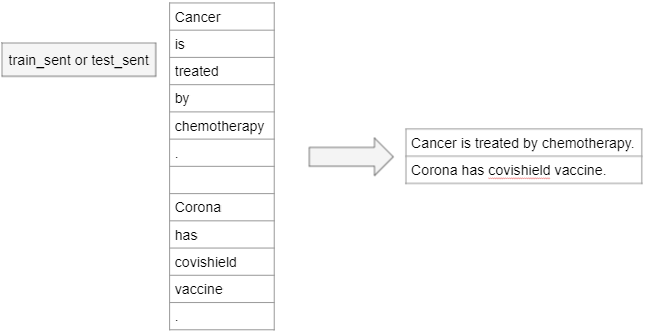

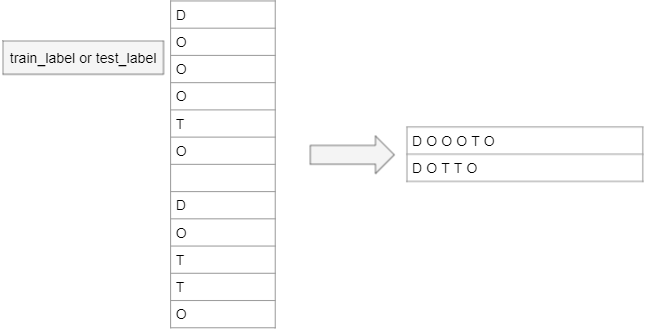

In [2]:
from google.colab import files

uploaded = files.upload()


Saving test_label to test_label
Saving test_sent to test_sent
Saving train_label to train_label
Saving train_sent to train_sent


In [3]:
import os
os.listdir()


['.config',
 'train_label',
 'train_sent',
 'test_label',
 'test_sent',
 'sample_data']

In [5]:
train_sent_path = 'train_sent'
train_label_path = 'train_label'
test_sent_path = 'test_sent'
test_label_path = 'test_label'

In [6]:
def load_sentences_and_labels(sent_file, label_file):
    sentences = []
    labels = []
    with open(sent_file, 'r') as f_sent, open(label_file, 'r') as f_label:
        current_sentence = []
        current_labels = []
        for word_line, label_line in zip(f_sent, f_label):
            word_line = word_line.strip()
            label_line = label_line.strip()

            if word_line == '' and label_line == '':
                if current_sentence:
                    sentences.append(current_sentence)
                    labels.append(current_labels)
                    current_sentence = []
                    current_labels = []
            else:
                current_sentence.append(word_line)
                current_labels.append(label_line)

        # Add last sentence if file doesn't end with a blank line
        if current_sentence:
            sentences.append(current_sentence)
            labels.append(current_labels)

    return sentences, labels


# Load train and test datasets
train_sentences, train_labels = load_sentences_and_labels('train_sent', 'train_label')
test_sentences, test_labels = load_sentences_and_labels('test_sent', 'test_label')

# Print first 5 sentences with their labels
print("🔹 Sample Sentences and Labels from Training Data:")
for i in range(5):
    print(f"\nSentence {i+1}: {' '.join(train_sentences[i])}")
    print(f"Labels   {i+1}: {' '.join(train_labels[i])}")

🔹 Sample Sentences and Labels from Training Data:

Sentence 1: All live births > or = 23 weeks at the University of Vermont in 1995 ( n = 2395 ) were retrospectively analyzed for delivery route , indication for cesarean , gestational age , parity , and practice group ( to reflect risk status )
Labels   1: O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O

Sentence 2: The total cesarean rate was 14.4 % ( 344 of 2395 ) , and the primary rate was 11.4 % ( 244 of 2144 )
Labels   2: O O O O O O O O O O O O O O O O O O O O O O O O O

Sentence 3: Abnormal presentation was the most common indication ( 25.6 % , 88 of 344 )
Labels   3: O O O O O O O O O O O O O O O

Sentence 4: The `` corrected '' cesarean rate ( maternal-fetal medicine and transported patients excluded ) was 12.4 % ( 273 of 2194 ) , and the `` corrected '' primary rate was 9.6 % ( 190 of 1975 )
Labels   4: O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O

Senten

### Count the number of sentences in the processed train and test dataset

In [7]:
print("\n✅ Dataset Statistics:")
print(f"Number of sentences in train set: {len(train_sentences)}")
print(f"Number of sentences in test set: {len(test_sentences)}")


✅ Dataset Statistics:
Number of sentences in train set: 2599
Number of sentences in test set: 1056


### Count the number of lines of labels in the processed train and test dataset.

In [8]:
print("\n✅ Dataset Statistics:")

print(f"Number of label lines in train set: {sum(len(labels) for labels in train_labels)}")
print(f"Number of label lines in test set: {sum(len(labels) for labels in test_labels)}")


✅ Dataset Statistics:
Number of label lines in train set: 45902
Number of label lines in test set: 18618


##Concept Identification

We will first explore what are the various concepts present in the dataset. For this, we will use PoS Tagging.



### Extract those tokens which have NOUN or PROPN as their PoS tag and find their frequency

In [9]:
import spacy
from collections import Counter

# Load the small English model
nlp = spacy.load("en_core_web_sm")

# Combine all sentences from train and test
all_sentences = train_sentences + test_sentences

# Flatten all tokens into a single list
all_text = [" ".join(sentence) for sentence in all_sentences]
all_text = " ".join(all_text)

# Process with spaCy
doc = nlp(all_text)

# Count nouns and proper nouns
noun_counter = Counter()
for token in doc:
    if token.pos_ in ["NOUN", "PROPN"]:
        noun_counter[token.text.lower()] += 1  # Normalize to lowercase

# Print top 25 most common
print("🔹 Top 25 Most Common NOUN/PROPN Tokens:\n")
for word, count in noun_counter.most_common(25):
    print(f"{word}: {count}")


🔹 Top 25 Most Common NOUN/PROPN Tokens:

patients: 507
treatment: 304
%: 247
cancer: 211
therapy: 177
study: 173
disease: 149
cell: 142
lung: 118
group: 111
results: 104
effects: 99
gene: 92
chemotherapy: 91
use: 87
effect: 82
women: 81
analysis: 76
risk: 74
surgery: 73
cases: 72
p: 72
rate: 68
survival: 67
response: 66


### Print the top 25 most common tokens with NOUN or PROPN PoS tags

In [10]:
import spacy
from collections import Counter

# Load the spaCy English model
nlp = spacy.load("en_core_web_sm")

# Combine all train and test sentences
all_sentences_combined = train_sentences + test_sentences

# Flatten sentences into one large text
text_data = [" ".join(sentence) for sentence in all_sentences_combined]
full_text = " ".join(text_data)

# Process text with spaCy
doc = nlp(full_text)

# Count NOUN and PROPN tokens
noun_counter = Counter()
for token in doc:
    if token.pos_ in ["NOUN", "PROPN"]:
        noun_counter[token.text.lower()] += 1  # Case-insensitive count

# Print the top 25 most frequent NOUN/PROPN tokens
print("🔹 Top 25 Most Common NOUN/PROPN Tokens:\n")
for i, (token, freq) in enumerate(noun_counter.most_common(25), 1):
    print(f"{i:>2}. {token} : {freq}")


🔹 Top 25 Most Common NOUN/PROPN Tokens:

 1. patients : 507
 2. treatment : 304
 3. % : 247
 4. cancer : 211
 5. therapy : 177
 6. study : 173
 7. disease : 149
 8. cell : 142
 9. lung : 118
10. group : 111
11. results : 104
12. effects : 99
13. gene : 92
14. chemotherapy : 91
15. use : 87
16. effect : 82
17. women : 81
18. analysis : 76
19. risk : 74
20. surgery : 73
21. cases : 72
22. p : 72
23. rate : 68
24. survival : 67
25. response : 66


## Defining features for CRF





In [11]:
# Let's define the features to get the feature value for one word.
def word2features(sent, i, nlp):
    """
    sent: list of tokens (strings)
    i: index of current token in sent
    nlp: spaCy language model for PoS tagging
    """
    # Process sentence with spaCy to get PoS tags
    doc = nlp(" ".join(sent))
    token = doc[i]

    features = {
        'word.lower()': token.text.lower(),
        'word.isupper()': token.text.isupper(),
        'word.istitle()': token.text.istitle(),
        'pos': token.pos_,
        'BOS': i == 0,  # Beginning of sentence
        'EOS': i == len(sent) - 1,  # End of sentence
    }

    # Previous word features
    if i > 0:
        prev_token = doc[i - 1]
        features.update({
            'prev_word.lower()': prev_token.text.lower(),
            'prev_pos': prev_token.pos_,
        })
    else:
        features.update({
            'prev_word.lower()': '<START>',
            'prev_pos': '<START>',
        })

    return features


In [12]:
def sent2features(sent, nlp):
    return [word2features(sent, i, nlp) for i in range(len(sent))]


## Getting the features

### Write a code/function to get the features for a sentence

In [13]:
# Write a code to get features for a sentence.
def sent2features(sent, nlp):
    """
    Extract features for each word in the sentence.

    Parameters:
    - sent: List of tokens (words) in the sentence
    - nlp: spaCy model to get PoS tags

    Returns:
    - List of feature dicts, one per word
    """
    return [word2features(sent, i, nlp) for i in range(len(sent))]


In [14]:
import spacy

nlp = spacy.load("en_core_web_sm")

sentence = ["The", "patient", "was", "diagnosed", "with", "diabetes", "."]
features = sent2features(sentence, nlp)

for i, f in enumerate(features):
    print(f"Word: {sentence[i]}")
    print(f"Features: {f}")
    print()


Word: The
Features: {'word.lower()': 'the', 'word.isupper()': False, 'word.istitle()': True, 'pos': 'DET', 'BOS': True, 'EOS': False, 'prev_word.lower()': '<START>', 'prev_pos': '<START>'}

Word: patient
Features: {'word.lower()': 'patient', 'word.isupper()': False, 'word.istitle()': False, 'pos': 'NOUN', 'BOS': False, 'EOS': False, 'prev_word.lower()': 'the', 'prev_pos': 'DET'}

Word: was
Features: {'word.lower()': 'was', 'word.isupper()': False, 'word.istitle()': False, 'pos': 'AUX', 'BOS': False, 'EOS': False, 'prev_word.lower()': 'patient', 'prev_pos': 'NOUN'}

Word: diagnosed
Features: {'word.lower()': 'diagnosed', 'word.isupper()': False, 'word.istitle()': False, 'pos': 'VERB', 'BOS': False, 'EOS': False, 'prev_word.lower()': 'was', 'prev_pos': 'AUX'}

Word: with
Features: {'word.lower()': 'with', 'word.isupper()': False, 'word.istitle()': False, 'pos': 'ADP', 'BOS': False, 'EOS': False, 'prev_word.lower()': 'diagnosed', 'prev_pos': 'VERB'}

Word: diabetes
Features: {'word.lower(

### Write a code/function to get the labels of a sentence

In [15]:
# Write a code to get the labels for a sentence.
def get_labels(label_lines):
    """
    Convert label lines for one sentence into a list of labels.

    Parameters:
    - label_lines: list of label strings (e.g., ['O', 'B-D', 'I-D', 'O', ...])

    Returns:
    - List of labels for the sentence
    """
    # Assuming label_lines is already a list of labels for the sentence tokens
    return label_lines


In [16]:
sentence_labels = ['O', 'O', 'O', 'B-D', 'I-D', 'O', 'O']
labels = get_labels(sentence_labels)
print(labels)


['O', 'O', 'O', 'B-D', 'I-D', 'O', 'O']


## Define input and target variables


Correctly computing X and Y sequence matrices for training and test data.
Check that both sentences and labels are processed

### Define the features' values for each sentence as input variable  for CRF model in test and the train dataset

In [18]:
def sent2features(sent, doc):
    """
    sent: list of tokens (words)
    doc: spaCy Doc object of the entire sentence (processed once)
    """
    features = []
    for i in range(len(sent)):
        token = doc[i]
        feature_dict = {
            'word.lower()': token.text.lower(),
            'word.isupper()': token.text.isupper(),
            'word.istitle()': token.text.istitle(),
            'pos': token.pos_,
            'BOS': i == 0,
            'EOS': i == len(sent) - 1,
        }
        if i > 0:
            prev_token = doc[i-1]
            feature_dict.update({
                'prev_word.lower()': prev_token.text.lower(),
                'prev_pos': prev_token.pos_,
            })
        else:
            feature_dict.update({
                'prev_word.lower()': '<START>',
                'prev_pos': '<START>',
            })
        features.append(feature_dict)
    return features

# Then, when you generate features for all sentences:

X_train = []
for sent in train_sentences:
    doc = nlp(" ".join(sent))    # Process sentence once
    feats = sent2features(sent, doc)
    X_train.append(feats)

X_test = []
for sent in test_sentences:
    doc = nlp(" ".join(sent))
    feats = sent2features(sent, doc)
    X_test.append(feats)


In [19]:
print(X_train)
print(X_test)

[[{'word.lower()': 'all', 'word.isupper()': False, 'word.istitle()': True, 'pos': 'DET', 'BOS': True, 'EOS': False, 'prev_word.lower()': '<START>', 'prev_pos': '<START>'}, {'word.lower()': 'live', 'word.isupper()': False, 'word.istitle()': False, 'pos': 'ADJ', 'BOS': False, 'EOS': False, 'prev_word.lower()': 'all', 'prev_pos': 'DET'}, {'word.lower()': 'births', 'word.isupper()': False, 'word.istitle()': False, 'pos': 'NOUN', 'BOS': False, 'EOS': False, 'prev_word.lower()': 'live', 'prev_pos': 'ADJ'}, {'word.lower()': '>', 'word.isupper()': False, 'word.istitle()': False, 'pos': 'PUNCT', 'BOS': False, 'EOS': False, 'prev_word.lower()': 'births', 'prev_pos': 'NOUN'}, {'word.lower()': 'or', 'word.isupper()': False, 'word.istitle()': False, 'pos': 'CCONJ', 'BOS': False, 'EOS': False, 'prev_word.lower()': '>', 'prev_pos': 'PUNCT'}, {'word.lower()': '=', 'word.isupper()': False, 'word.istitle()': False, 'pos': 'NOUN', 'BOS': False, 'EOS': False, 'prev_word.lower()': 'or', 'prev_pos': 'CCONJ'

### Define the labels as the target variable for test and the train dataset

In [21]:
def read_labels(file_path):
    """
    Reads label file and returns list of label sentences.
    Each sentence is a list of labels.
    Sentences separated by blank lines.
    """
    label_sentences = []
    with open(file_path, 'r') as f:
        labels = []
        for line in f:
            line = line.strip()
            if line == "":
                if labels:
                    label_sentences.append(labels)
                    labels = []
            else:
                labels.append(line)
        if labels:
            label_sentences.append(labels)  # last sentence
    return label_sentences

# Usage:
train_labels_sentences = read_labels('train_label')
test_labels_sentences = read_labels('test_label')

y_train = train_labels_sentences
y_test = test_labels_sentences


In [22]:
len(train_sentences[i]) == len(y_train[i])
len(test_sentences[i]) == len(y_test[i])


True

## Build the CRF Model

In [24]:
# Build the CRF model.
import sklearn_crfsuite

# Initialize CRF
crf = sklearn_crfsuite.CRF(
    algorithm='lbfgs',
    c1=0.1,
    c2=0.1,
    max_iterations=100,
    all_possible_transitions=True
)

# Train
crf.fit(X_train, y_train)


# Predict
y_pred = crf.predict(X_test)

print(y_pred)

[list(['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O'])
 list(['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D'])
 list(['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O'])
 ... list(['T', 'T', 'T', 'T', 'T', 'T', 'T', 'T', 'O', 'O'])
 list(['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O'])
 list(['O', 'O', 'O', 'O', 'D', 'D', 'D'])]


## Evaluation

### Predict the labels of each of the tokens in each sentence of the test dataset that has been pre processed earlier.

In [25]:
for i in range(3):
    print(f"Sentence {i+1}:")
    print("Tokens: ", test_sentences[i])
    print("Predicted labels: ", y_pred[i])
    print()


Sentence 1:
Tokens:  ['Furthermore', ',', 'when', 'all', 'deliveries', 'were', 'analyzed', ',', 'regardless', 'of', 'risk', 'status', 'but', 'limited', 'to', 'gestational', 'age', '>', 'or', '=', '36', 'weeks', ',', 'the', 'rates', 'did', 'not', 'change', '(', '12.6', '%', ',', '280', 'of', '2214', ';', 'primary', '9.2', '%', ',', '183', 'of', '1994', ')']
Predicted labels:  ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Sentence 2:
Tokens:  ['As', 'the', 'ambient', 'temperature', 'increases', ',', 'there', 'is', 'an', 'increase', 'in', 'insensible', 'fluid', 'loss', 'and', 'the', 'potential', 'for', 'dehydration']
Predicted labels:  ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'D']

Sentence 3:
Tokens:  ['The', 'daily', 'high', 'temperature', 'ranged', 'from', '71', '

### Calculate the f1 score using the actual labels and the predicted labels of the test dataset.

In [26]:
from sklearn_crfsuite import metrics
# y_test = actual labels (list of lists)
# y_pred = predicted labels (list of lists)

f1_score = metrics.flat_f1_score(y_test, y_pred,
                                average='weighted',  # weighted avg to account for label imbalance
                                labels=crf.classes_)

print(f"Weighted F1 score on test data: {f1_score:.4f}")


Weighted F1 score on test data: 0.8822


##Identifying Diseases and Treatments using Custom NER

We now use the CRF model's prediction to prepare a record of diseases identified in the corpus and treatments used for the diseases.



### Create the logic to get all the predicted treatments (T) labels corresponding to each disease (D) label in the test dataset.

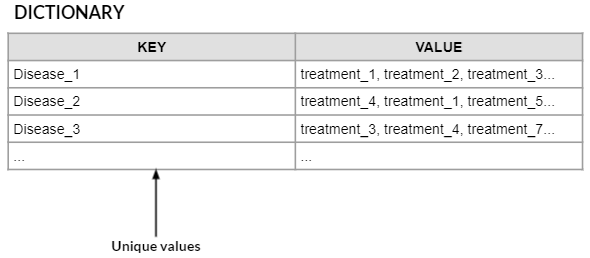

In [28]:
from collections import defaultdict

def extract_entities(tokens, labels, entity_prefix):
    """
    Extract continuous entities of a given prefix (e.g. 'D' for disease, 'T' for treatment)
    from tokens and corresponding BIO labels.
    """
    entities = []
    entity_tokens = []
    for token, label in zip(tokens, labels):
        if label == f'B-{entity_prefix}':
            # Start of new entity
            if entity_tokens:
                entities.append(" ".join(entity_tokens))
                entity_tokens = []
            entity_tokens = [token]
        elif label == f'I-{entity_prefix}' and entity_tokens:
            # Continuation of entity
            entity_tokens.append(token)
        else:
            # Outside the entity or different entity type
            if entity_tokens:
                entities.append(" ".join(entity_tokens))
                entity_tokens = []
    # Append last entity if any
    if entity_tokens:
        entities.append(" ".join(entity_tokens))
    return entities

# Initialize dictionary to hold disease → treatments
disease_treatment_map = defaultdict(set)

# Iterate over all test sentences and predicted labels
for tokens, labels in zip(test_sentences, y_pred):
    diseases = extract_entities(tokens, labels, 'D')
    treatments = extract_entities(tokens, labels, 'T')
    for disease in diseases:
        for treatment in treatments:
            disease_treatment_map[disease].add(treatment)

# Convert sets to lists for cleaner output
disease_treatment_map = {disease: list(treatments) for disease, treatments in disease_treatment_map.items()}

# Print the mappings
for disease, treatments in disease_treatment_map.items():
    print(f"Disease: {disease}")
    print(f"Treatments: {treatments}")
    print()


### Predict the treatment for the disease name: 'hereditary retinoblastoma'

In [30]:
print("All predicted diseases:")
for disease in disease_treatment_map.keys():
    print(disease)


All predicted diseases:


In [29]:
disease_name = "hereditary retinoblastoma"

if disease_name in disease_treatment_map:
    treatments = disease_treatment_map[disease_name]
    print(f"Predicted treatment(s) for '{disease_name}': {treatments}")
else:
    print(f"No predicted treatments found for '{disease_name}'.")


No predicted treatments found for 'hereditary retinoblastoma'.
